# GAN on C2C ski touring outing data

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras import models, layers, losses, optimizers, metrics, activations
import tensorview as tv
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from plotly import express as px, graph_objects as go, subplots as sp
import itertools

In [2]:
area_title = 'haute-savoie'

In [3]:
rating_unmapper = {0: 'awful', 1: 'poor', 2: 'average', 3: 'good', 4: 'excellent'}
ski_rating_unmapper = {**{3*i + j: f'{i+1}.{j+1}' for i,j in itertools.product(range(5), range (3))}, 15: '5.4', 16: '5.5', 17: '5.6'}

In [4]:
df_outings = pd.read_parquet(f'data/C2C/outings_{area_title}.parquet')

In [5]:
used_cols = ['ski_rating_num', 'elevation_max', 'elevation_up_snow', 'elevation_down_snow', 'condition_rating_num', 
             'TEMPERATURE_MORNING_C', 'temp_morning_7d', 'temp_morning_30d', 'day_of_season'] 
#, 'season']

condition = (df_outings.elevation_up_snow < 5000) & (df_outings.elevation_down_snow < 5000) & (df_outings.elevation_max < 5000) \
                & (df_outings.elevation_up_snow > 200) & (df_outings.elevation_down_snow > 200) & (df_outings.elevation_max > 200) \
               & ((df_outings.quality == 'fine') | (df_outings.quality == 'medium') | (df_outings.quality == 'great'))

df_sel = df_outings.loc[condition, used_cols]
df_sel = df_sel[(~df_sel.isna().any(axis=1))]
len(df_sel)

6656

In [6]:
scaler = StandardScaler()
df_sel_scaled = scaler.fit_transform(df_sel)

## Model

In [7]:
batch_size = 512
latent_dim = 20
num_features = len(used_cols)

In [8]:
disc_learning_rate = 0.004
gen_learning_rate  = 0.005

In [9]:
generator = models.Sequential([
    layers.Dense(32, input_dim=latent_dim, name='g_1', activation=activations.relu),
    layers.Dropout(0.3),
    layers.Dense(48, name='g_2', activation=activations.relu),
    layers.Dropout(0.2),
    layers.Dense(48, name='g_3', activation=activations.relu),
    layers.Dense(64, name='g_4', activation=activations.relu),
    layers.Dropout(0.2),
    layers.Dense(num_features, name='g_5')
], name='generator')

In [10]:
discriminator = models.Sequential([
    layers.Dense(64, input_dim=num_features, name='d_1', activation=activations.relu),
    layers.Dropout(0.3),
    layers.Dense(48, name='d_2', activation=activations.relu),
    layers.Dropout(0.2),
    layers.Dense(48, name='d_3', activation=activations.relu),
    layers.Dense(32, name='d_4', activation=activations.relu),
    layers.Dropout(0.2),
    layers.Dense(1, activation='sigmoid', name='d_5')
], name='discriminator')

In [11]:
class CustomSchedule(optimizers.schedules.LearningRateSchedule):
    def __init__(self, lr: float = 0.002, step_lr: float = 0.01):
        super(CustomSchedule, self).__init__()
        self.lr = lr
        self.step_lr = step_lr

    def __call__(self, step):
        return self.lr / tf.math.log(step * self.step_lr + 2)

In [12]:
discriminator.compile(optimizer=optimizers.RMSprop(CustomSchedule(disc_learning_rate, 0.001), momentum=0.001), 
                loss=losses.binary_crossentropy,
                metrics=['accuracy'])
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
d_1 (Dense)                  (None, 64)                640       
_________________________________________________________________
dropout_3 (Dropout)          (None, 64)                0         
_________________________________________________________________
d_2 (Dense)                  (None, 48)                3120      
_________________________________________________________________
dropout_4 (Dropout)          (None, 48)                0         
_________________________________________________________________
d_3 (Dense)                  (None, 48)                2352      
_________________________________________________________________
d_4 (Dense)                  (None, 32)                1568      
_________________________________________________________________
dropout_5 (Dropout)          (None, 32)              

In [13]:
# Stack the generator and discriminator in order to train the generator
# Do not train the discriminator along with the generator
discriminator.trainable = False 
combined = models.Sequential([generator, discriminator])
combined.compile(optimizer=optimizers.RMSprop(CustomSchedule(gen_learning_rate, 0.001), momentum=0.001), 
              loss=losses.binary_crossentropy,
              metrics=['accuracy'])
combined.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
generator (Sequential)       (None, 9)                 8329      
_________________________________________________________________
discriminator (Sequential)   (None, 1)                 7713      
Total params: 16,042
Trainable params: 8,329
Non-trainable params: 7,713
_________________________________________________________________


## Train

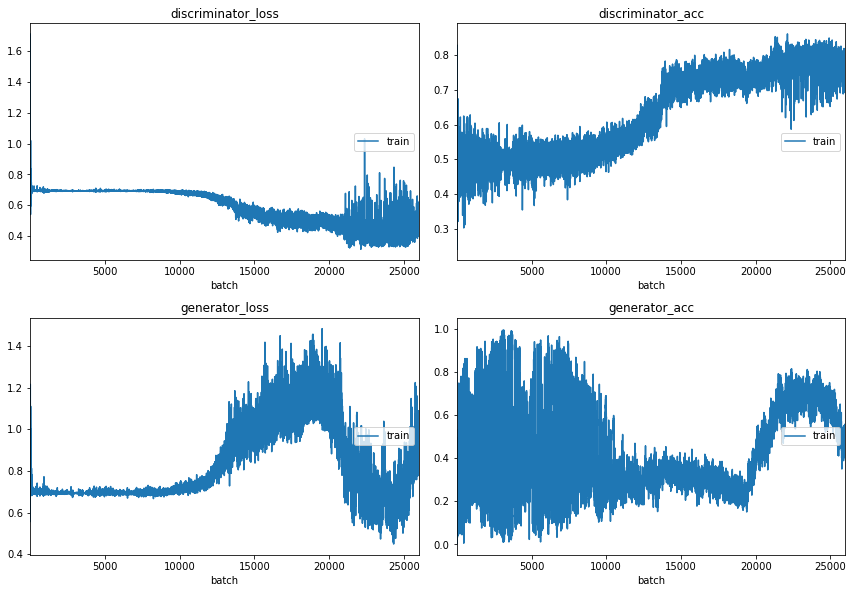

In [14]:
epochs = 2000

batch_per_epoch = len(df_sel_scaled)//batch_size

# Adversarial ground truths
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

tv_plot = tv.train.PlotMetrics(wait_num=50, columns=2, iter_num=epochs * batch_per_epoch)

for epoch in range(epochs):

    for b in range(batch_per_epoch):

        train_batch = df_sel_scaled[b * batch_size:(b+1) * batch_size]
        
        # Discriminator

        # Sample noise and generate a batch of new outings
        gen_latent = np.random.normal(0, 1, (batch_size, latent_dim))
        gen_outings = generator.predict(gen_latent)

        # Train the discriminator (real classified as true and generated as false)
        d_loss, d_acc = discriminator.train_on_batch(np.vstack((train_batch, gen_outings)), 
                                                     np.vstack((valid, fake)), 
                                                    reset_metrics=True)
        
        # Generator

        # Train the generator (wants discriminator to take fake outings as true)
        g_loss, g_acc = combined.train_on_batch(gen_latent, 
                                                 valid, 
                                                 reset_metrics=True)
        
        # Plot
        tv_plot.update({'discriminator_loss': d_loss, 'discriminator_acc': d_acc,
                        'generator_loss': g_loss, 'generator_acc': g_acc})
        tv_plot.draw()

## Test

In [15]:
gen_latent = np.random.normal(0, 1, (5000, latent_dim))
gen_outings = generator.predict(gen_latent)
gen_outings_unscaled = scaler.inverse_transform(gen_outings)

In [16]:
df_generated = pd.DataFrame(gen_outings_unscaled, columns=used_cols)
df_generated['ski_rating'] = df_generated['ski_rating_num'].round().clip(0, 17).replace(ski_rating_unmapper)
df_generated['condition_rating'] = df_generated['condition_rating_num'].round().clip(0, 4).replace(rating_unmapper)

In [17]:
df_generated.head()

,ski_rating_num,elevation_max,elevation_up_snow,elevation_down_snow,condition_rating_num,TEMPERATURE_MORNING_C,temp_morning_7d,temp_morning_30d,day_of_season,ski_rating,condition_rating
0,10.924656,2875.481689,1143.923096,1149.232788,2.996511,-10.762115,-10.816666,-10.468476,13.429161,4.3,good
1,6.350895,3639.069580,1690.965088,1686.437500,2.995154,-3.260795,-5.860741,-6.317017,62.299290,3.1,good
2,8.423110,2574.737061,1633.378174,1322.545776,3.001907,-5.189271,-5.595870,-10.091634,17.243536,3.3,good
3,10.226665,3293.646240,2140.064697,2142.361816,2.964720,3.199045,1.623231,-2.588324,58.428844,4.2,good
4,7.428967,2027.687012,1229.509399,1241.567627,2.998121,-3.846434,-4.565955,-4.479797,48.196209,3.2,good


Elevation [m]


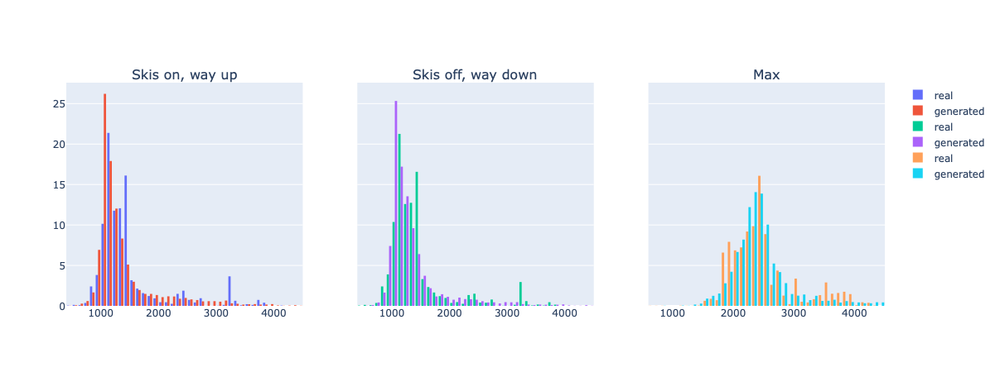

In [18]:
print('Elevation [m]')
fig = sp.make_subplots(rows=1, cols=3, shared_yaxes=True, subplot_titles=['Skis on, way up', 'Skis off, way down', 'Max'])
bins = {'start': 0, 'end': 4500, 'size': 100}
fig.add_trace(go.Histogram(x=df_sel['elevation_up_snow'], xbins=bins, name='real', histnorm='percent'), row=1, col=1)
fig.add_trace(go.Histogram(x=df_generated['elevation_up_snow'], xbins=bins, name='generated', histnorm='percent'), row=1, col=1)
fig.add_trace(go.Histogram(x=df_sel['elevation_down_snow'], xbins=bins, name='real', histnorm='percent'), row=1, col=2)
fig.add_trace(go.Histogram(x=df_generated['elevation_down_snow'], xbins=bins, name='generated', histnorm='percent'), row=1, col=2)
fig.add_trace(go.Histogram(x=df_sel['elevation_max'], xbins=bins, name='real', histnorm='percent'), row=1, col=3)
fig.add_trace(go.Histogram(x=df_generated['elevation_max'], xbins=bins, name='generated', histnorm='percent'), row=1, col=3)

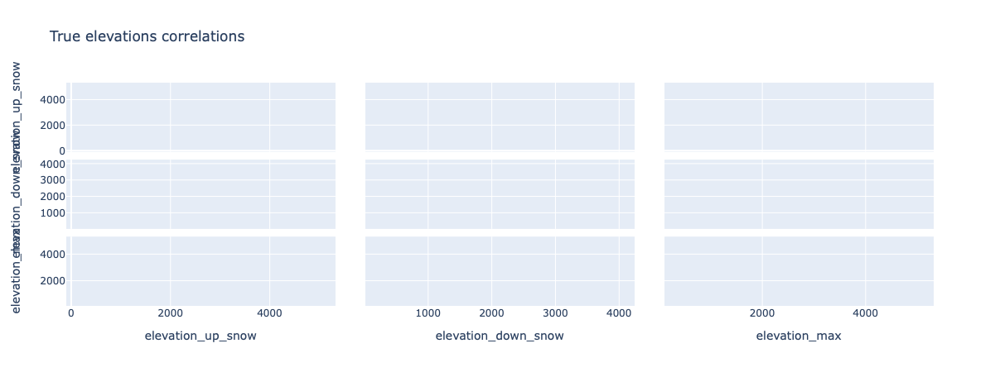

In [19]:
px.scatter_matrix(df_sel[['elevation_up_snow', 'elevation_down_snow', 'elevation_max']], opacity=0.1, title='True elevations correlations')

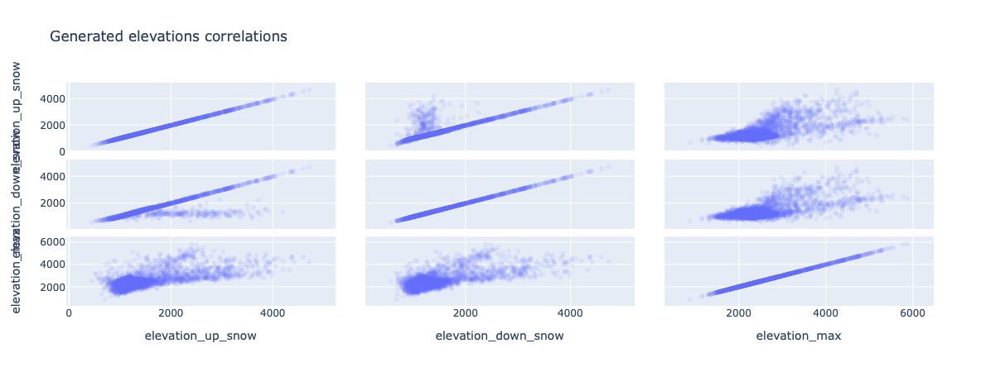

In [20]:
px.scatter_matrix(df_generated[['elevation_up_snow', 'elevation_down_snow', 'elevation_max']], opacity=0.1, title='Generated elevations correlations')

Mean/std day of season, for true=7.71/46.9, for generated=2.32/40.6


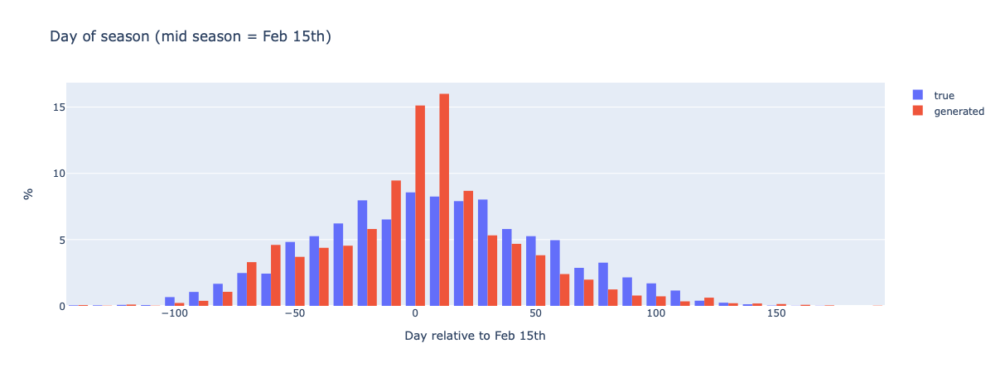

In [21]:
print(f'Mean/std day of season, for true={df_sel.day_of_season.mean():.3g}/{df_sel.day_of_season.std():.3g}, for generated={df_generated.day_of_season.mean():.3g}/{df_generated.day_of_season.std():.3g}')

fig = go.Figure(layout=dict(title='Day of season (mid season = Feb 15th)', bargroupgap=0.01, 
                            xaxis=dict(title='Day relative to Feb 15th'), yaxis=dict(title='%')))
fig.add_histogram(x=df_sel.day_of_season, name='true', nbinsx=52, histnorm='percent')
fig.add_histogram(x=df_generated.day_of_season, name='generated', nbinsx=52, histnorm='percent')

### Ski ratings

Mean/std ski rating num, for true=6.38/3.07, for generated=7.94/2.74


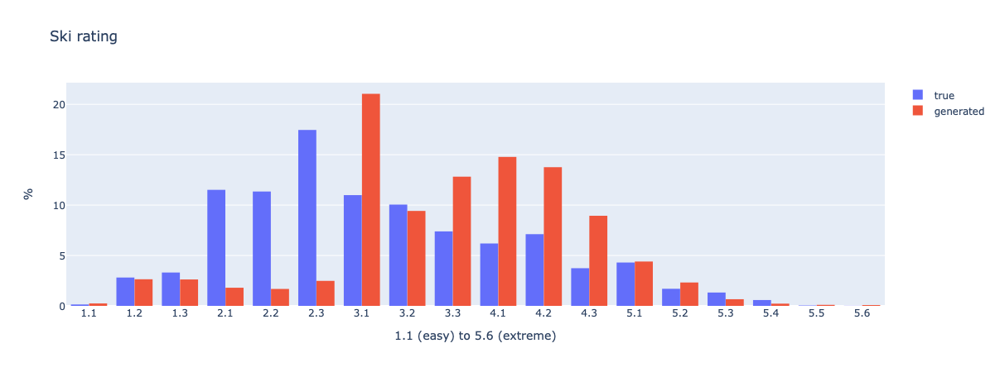

In [22]:
print(f'Mean/std ski rating num, for true={df_sel.ski_rating_num.mean():.3g}/{df_sel.ski_rating_num.std():.3g}, for generated={df_generated.ski_rating_num.mean():.3g}/{df_generated.ski_rating_num.std():.3g}')
fig = go.Figure(layout=dict(title='Ski rating', bargroupgap=0.01, 
                            xaxis=dict(title='1.1 (easy) to 5.6 (extreme)', categoryorder='array', categoryarray=list(ski_rating_unmapper.values()), type="category"), yaxis=dict(title='%')))
fig.add_histogram(x=df_outings[condition].ski_rating, name='true', histnorm='percent')
fig.add_histogram(x=df_generated.ski_rating, name='generated', histnorm='percent')

### Condition ratings

Mean/std condition rating num, for true=2.95/0.792, for generated=3.05/0.736


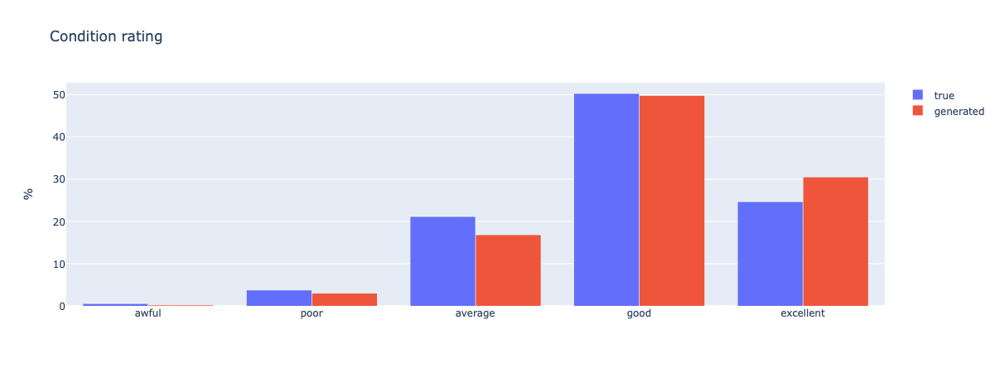

In [23]:
print(f'Mean/std condition rating num, for true={df_sel.condition_rating_num.mean():.3g}/{df_sel.condition_rating_num.std():.3g}, for generated={df_generated.condition_rating_num.mean():.3g}/{df_generated.condition_rating_num.std():.3g}')
fig = go.Figure(layout=dict(title='Condition rating', bargroupgap=0.01, 
                            xaxis=dict(categoryorder='array', categoryarray=list(rating_unmapper.values()), type="category"), yaxis=dict(title='%')))
fig.add_histogram(x=df_outings[condition].condition_rating, name='true', histnorm='percent')
fig.add_histogram(x=df_generated.condition_rating, name='generated', histnorm='percent')

### Temperatures

Mean/std morning temperature, for true=-5.31/6.7, for generated=-8.67/7.88


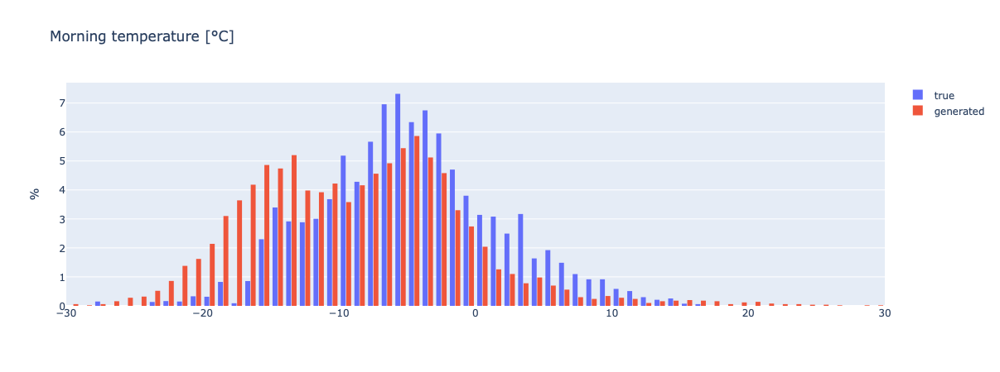

In [24]:
print(f'Mean/std morning temperature, for true={df_sel.TEMPERATURE_MORNING_C.mean():.3g}/{df_sel.TEMPERATURE_MORNING_C.std():.3g}, for generated={df_generated.TEMPERATURE_MORNING_C.mean():.3g}/{df_generated.TEMPERATURE_MORNING_C.std():.3g}')
fig = go.Figure(layout=dict(title='Morning temperature [°C]', bargroupgap=0.1, yaxis=dict(title='%')))
bins = {'start': -35, 'end': 30, 'size': 1}
fig.add_histogram(x=df_sel.TEMPERATURE_MORNING_C, name='true', histnorm='percent', xbins=bins)
fig.add_histogram(x=df_generated.TEMPERATURE_MORNING_C, name='generated', histnorm='percent', xbins=bins)

Mean/std 7 day morning temperature, for true=-4.79/5.38, for generated=-6.73/4.88


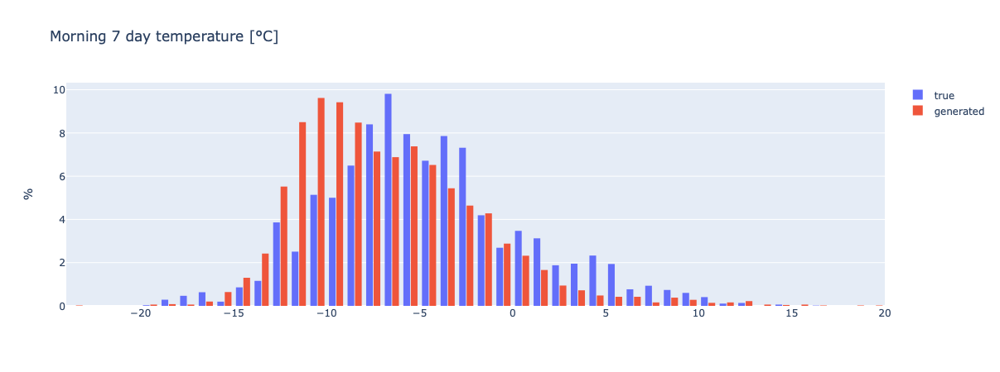

In [25]:
print(f'Mean/std 7 day morning temperature, for true={df_sel.temp_morning_7d.mean():.3g}/{df_sel.temp_morning_7d.std():.3g}, for generated={df_generated.temp_morning_7d.mean():.3g}/{df_generated.temp_morning_7d.std():.3g}')
fig = go.Figure(layout=dict(title='Morning 7 day temperature [°C]', bargroupgap=0.1, yaxis=dict(title='%')))
bins = {'start': -35, 'end': 30, 'size': 1}
fig.add_histogram(x=df_sel.temp_morning_7d, name='true', histnorm='percent', xbins=bins)
fig.add_histogram(x=df_generated.temp_morning_7d, name='generated', histnorm='percent', xbins=bins)

Mean/std 30 day morning temperature, for true=-4.72/4.23, for generated=-7.09/3.99


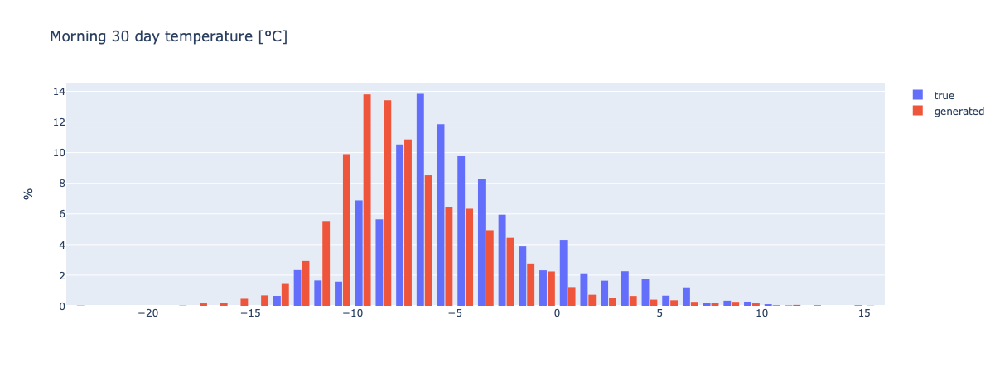

In [26]:
print(f'Mean/std 30 day morning temperature, for true={df_sel.temp_morning_30d.mean():.3g}/{df_sel.temp_morning_30d.std():.3g}, for generated={df_generated.temp_morning_30d.mean():.3g}/{df_generated.temp_morning_30d.std():.3g}')
fig = go.Figure(layout=dict(title='Morning 30 day temperature [°C]', bargroupgap=0.1, yaxis=dict(title='%')))
bins = {'start': -35, 'end': 30, 'size': 1}
fig.add_histogram(x=df_sel.temp_morning_30d, name='true', histnorm='percent', xbins=bins)
fig.add_histogram(x=df_generated.temp_morning_30d, name='generated', histnorm='percent', xbins=bins)

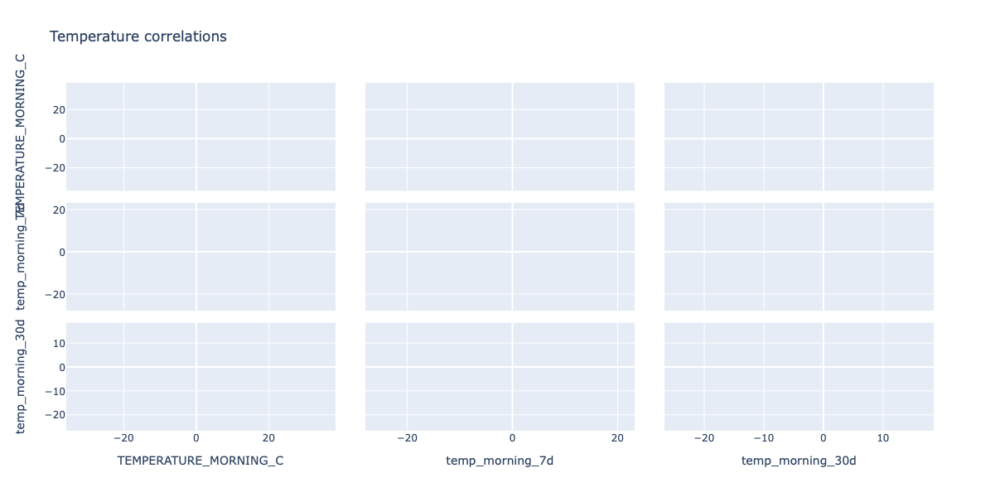

In [27]:
px.scatter_matrix(df_generated[['TEMPERATURE_MORNING_C', 'temp_morning_7d', 'temp_morning_30d']], opacity=0.1, 
                  title='Temperature correlations', height=600)

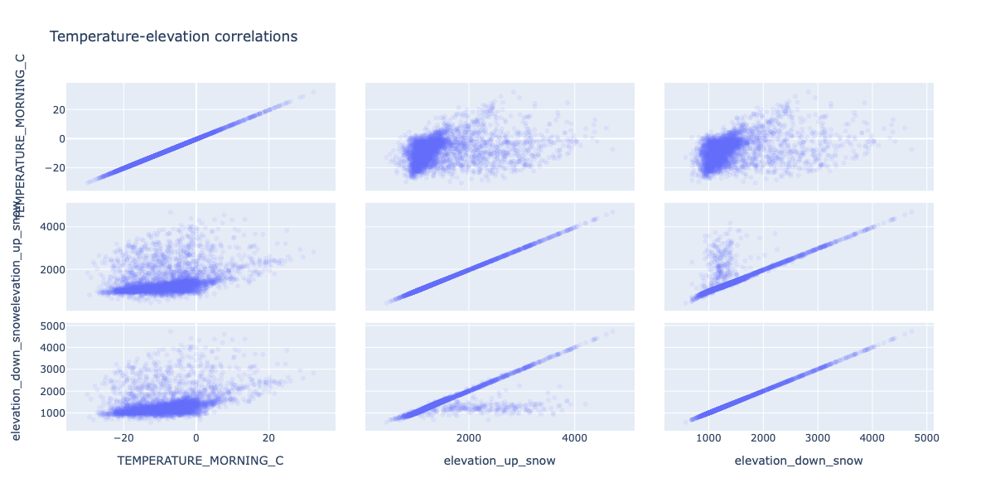

In [28]:
px.scatter_matrix(df_generated[['TEMPERATURE_MORNING_C', 'elevation_up_snow', 'elevation_down_snow']], opacity=0.1, 
                  title='Temperature-elevation correlations', height=600)

# Part-2 Adding some independency constraints on the generator

Temperatures are indepdendent of other features, the same for the "intrinsic" features of the outing: maximum elevation and ski rating.

The other elevations depend on the quantity and quality of snow and are thus dependent on the temperature, intrinsic features and day within the season (sun light is dependent on the day of the year).

In [71]:
num_temperature_features = 3
num_intrinsic_features = 2
num_dependent_features = num_features - num_temperature_features - num_intrinsic_features
num_latent2 = 10
gen_learning_rate2 = 0.002

In [72]:
def make_generator(n_feat: int, name: str, prefix: str, num_latent: int, num_element_base: int):
    return models.Sequential([
        layers.Dense(num_element_base * 2, input_dim=num_latent, name=f'{prefix}_1', activation=activations.relu),
        layers.Dropout(0.3),
        #layers.Dense(num_element_base * 4, name=f'{prefix}_2', activation=activations.relu),
        #layers.Dropout(0.2),
        layers.Dense(num_element_base * 6, name=f'{prefix}_4', activation=activations.relu),
        layers.Dropout(0.2),
        layers.Dense(n_feat, name=f'{prefix}_5')
    ], name=name)

gen_temp = make_generator(num_temperature_features, 'gen_temp', 'gt', num_latent2, 12)
gen_intrinsic = make_generator(num_intrinsic_features, 'gen_intrinsic', 'gi', num_latent2, 12)
gen_dependent = make_generator(num_dependent_features, 'gen_derived', 'gd', num_latent2, 16)

In [73]:
input_temp = layers.Input(num_latent2)
input_intrinsic = layers.Input(num_latent2)
num_latent_dep = num_latent2 - num_temperature_features - num_intrinsic_features
input_dep = layers.Input(num_latent_dep)
temp = gen_temp(input_temp)
intrinsic = gen_intrinsic(input_intrinsic)
input_dep2 = layers.concatenate([temp, intrinsic, input_dep])
dep = gen_dependent(input_dep2)
gen2_output = layers.concatenate([temp, intrinsic, dep])
generator2 = models.Model([input_temp, input_intrinsic, input_dep], gen2_output, name='generator2')

In [74]:
discriminator2 = models.Sequential([
    layers.Dense(64, input_dim=num_features, name='d_1', activation=activations.relu),
    layers.Dropout(0.3),
    layers.Dense(48, name='d_2', activation=activations.relu),
    layers.Dropout(0.2),
    layers.Dense(48, name='d_3', activation=activations.relu),
    layers.Dense(32, name='d_4', activation=activations.relu),
    layers.Dropout(0.2),
    layers.Dense(1, activation='sigmoid', name='d_5')
], name='discriminator2')

In [75]:
discriminator2.compile(optimizer=optimizers.RMSprop(CustomSchedule(disc_learning_rate, 0.005), momentum=0.0005), 
                loss=losses.binary_crossentropy,
                metrics=['accuracy'])
discriminator2.summary()

Model: "discriminator2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
d_1 (Dense)                  (None, 64)                640       
_________________________________________________________________
dropout_24 (Dropout)         (None, 64)                0         
_________________________________________________________________
d_2 (Dense)                  (None, 48)                3120      
_________________________________________________________________
dropout_25 (Dropout)         (None, 48)                0         
_________________________________________________________________
d_3 (Dense)                  (None, 48)                2352      
_________________________________________________________________
d_4 (Dense)                  (None, 32)                1568      
_________________________________________________________________
dropout_26 (Dropout)         (None, 32)             

In [76]:
# Stack the generator and discriminator in order to train the generator
# Do not train the discriminator along with the generator
discriminator2.trainable = False 
disc2 = discriminator2(generator2.output)
combined2 = models.Model(generator2.input, disc2, name='combined2')
combined2.compile(optimizer=optimizers.RMSprop(CustomSchedule(gen_learning_rate2, 0.005), momentum=0.0005), 
              loss=losses.binary_crossentropy,
              metrics=['accuracy'])
combined2.summary()

Model: "combined2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            [(None, 10)]         0                                            
__________________________________________________________________________________________________
gen_temp (Sequential)           (None, 3)            2283        input_4[0][0]                    
__________________________________________________________________________________________________
gen_intrinsic (Sequential)      (None, 2)            2210        input_5[0][0]                    
__________________________________________________________________________________________

## Train 2

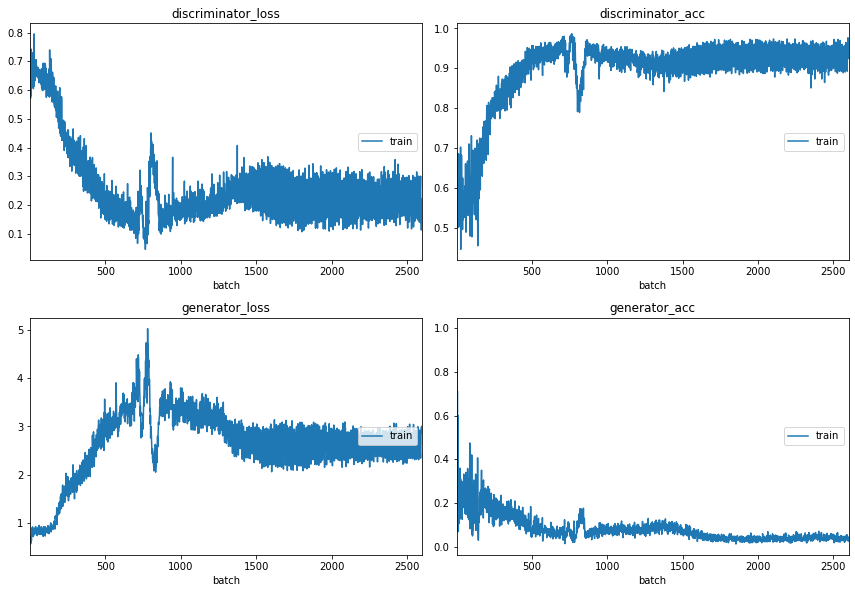

In [77]:
epochs = 200

batch_per_epoch = len(df_sel_scaled)//batch_size

# Adversarial ground truths
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

tv_plot = tv.train.PlotMetrics(wait_num=50, columns=2, iter_num=epochs * batch_per_epoch)

for epoch in range(epochs):

    for b in range(batch_per_epoch):

        train_batch = df_sel_scaled[b * batch_size:(b+1) * batch_size]
        
        # Discriminator

        # Sample noise and generate a batch of new outings
        gen_latent = [np.random.normal(0, 1, (batch_size, num_latent2)), np.random.normal(0, 1, (batch_size, num_latent2)), np.random.normal(0, 1, (batch_size, num_latent_dep))]
        gen_outings = generator2.predict(gen_latent)

        # Train the discriminator (real classified as true and generated as false)
        d_loss, d_acc = discriminator2.train_on_batch(np.vstack((train_batch, gen_outings)), 
                                                     np.vstack((valid, fake)), 
                                                    reset_metrics=True)
        
        # Generator

        # Train the generator (wants discriminator to take fake outings as true)
        g_loss, g_acc = combined2.train_on_batch(gen_latent, 
                                                 valid, 
                                                 reset_metrics=True)
        
        # Plot
        tv_plot.update({'discriminator_loss': d_loss, 'discriminator_acc': d_acc,
                        'generator_loss': g_loss, 'generator_acc': g_acc})
        tv_plot.draw()

## Test 2

In [78]:
gen_latent2 = [np.random.normal(0, 1, (5000, num_latent2)), np.random.normal(0, 1, (5000, num_latent2)), np.random.normal(0, 1, (5000, num_latent_dep))]
gen_outings2 = generator2.predict(gen_latent2)
gen_outings2_unscaled = scaler.inverse_transform(gen_outings2)

In [79]:
scores2 = discriminator2.predict(gen_outings2)
fooled2 = scores2 >= 0.5

In [80]:
scores2.mean(), fooled2.mean()

(0.08534364, 0.0284)

In [81]:
df_generated = pd.DataFrame(gen_outings2_unscaled, columns=used_cols)
df_generated['ski_rating'] = df_generated['ski_rating_num'].round().clip(0, 17).replace(ski_rating_unmapper)
df_generated['condition_rating'] = df_generated['condition_rating_num'].round().clip(0, 4).replace(rating_unmapper)

In [82]:
df_generated2_fooled = df_generated.loc[fooled2]

In [83]:
df_generated.head()

,ski_rating_num,elevation_max,elevation_up_snow,elevation_down_snow,condition_rating_num,TEMPERATURE_MORNING_C,temp_morning_7d,temp_morning_30d,day_of_season,ski_rating,condition_rating
0,9.241074,5313.314941,2933.509033,1851.323364,2.826678,6.941443,13.666471,12.494718,121.891899,4.1,good
1,3.637449,1936.635498,1124.146362,1228.793213,2.918236,-15.393591,-11.451848,-5.092685,-19.057886,2.2,good
2,5.979377,3496.029297,3322.246826,1262.947998,2.294590,-2.390363,-1.827272,-4.793490,20.361670,3.1,average
3,8.637104,2280.060303,1311.801514,1175.602661,3.099279,-4.635514,-1.488517,-3.992710,37.807770,4.1,good
4,11.193562,3900.099854,2262.764648,2146.633545,3.213291,4.491197,10.751629,10.823893,111.299873,4.3,good


In [84]:
df_generated2_fooled.head()

,ski_rating_num,elevation_max,elevation_up_snow,elevation_down_snow,condition_rating_num,TEMPERATURE_MORNING_C,temp_morning_7d,temp_morning_30d,day_of_season,ski_rating,condition_rating
5,10.070419,4069.543945,1388.982056,1367.597046,3.018918,6.643360,6.889822,5.679573,93.811226,4.2,good
14,6.832171,2714.989258,1269.608398,1279.197144,4.151556,-7.225201,-4.477033,-3.517388,-17.349094,3.2,excellent
62,6.913675,2785.566162,1185.518066,1189.952637,4.198419,-4.635945,-4.608895,-4.746165,45.741512,3.2,excellent
94,9.450825,1898.041626,1199.455444,1207.015747,3.177560,-7.064552,-0.090848,-2.775009,-40.545326,4.1,good
136,10.539455,2167.261230,1331.963867,1346.475830,4.293845,-5.430401,-0.353114,-2.882867,29.348347,4.3,excellent


Elevation [m]


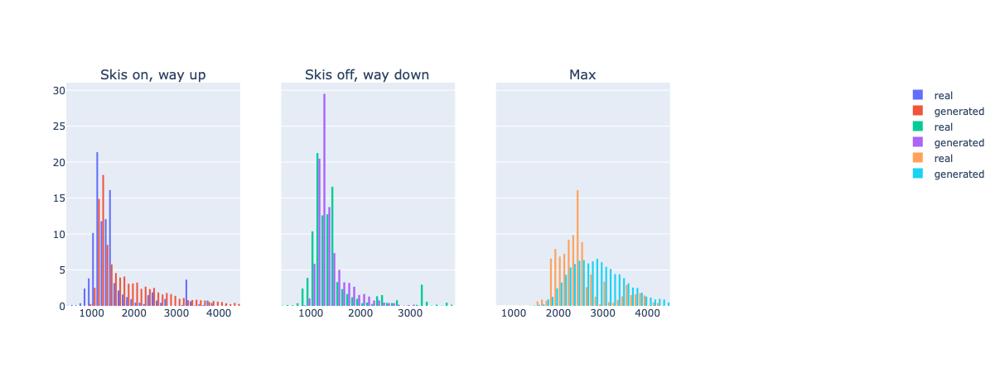

In [85]:
print('Elevation [m]')
fig = sp.make_subplots(rows=1, cols=4, shared_yaxes=True, subplot_titles=['Skis on, way up', 'Skis off, way down', 'Max'])
bins = {'start': 0, 'end': 4500, 'size': 100}
fig.add_trace(go.Histogram(x=df_sel['elevation_up_snow'], xbins=bins, name='real', histnorm='percent'), row=1, col=1)
fig.add_trace(go.Histogram(x=df_generated['elevation_up_snow'], xbins=bins, name='generated', histnorm='percent'), row=1, col=1)
fig.add_trace(go.Histogram(x=df_sel['elevation_down_snow'], xbins=bins, name='real', histnorm='percent'), row=1, col=2)
fig.add_trace(go.Histogram(x=df_generated['elevation_down_snow'], xbins=bins, name='generated', histnorm='percent'), row=1, col=2)
fig.add_trace(go.Histogram(x=df_sel['elevation_max'], xbins=bins, name='real', histnorm='percent'), row=1, col=3)
fig.add_trace(go.Histogram(x=df_generated['elevation_max'], xbins=bins, name='generated', histnorm='percent'), row=1, col=3)

Mean/std day of season, for true=7.71/46.9, for generated=18.5/39.9


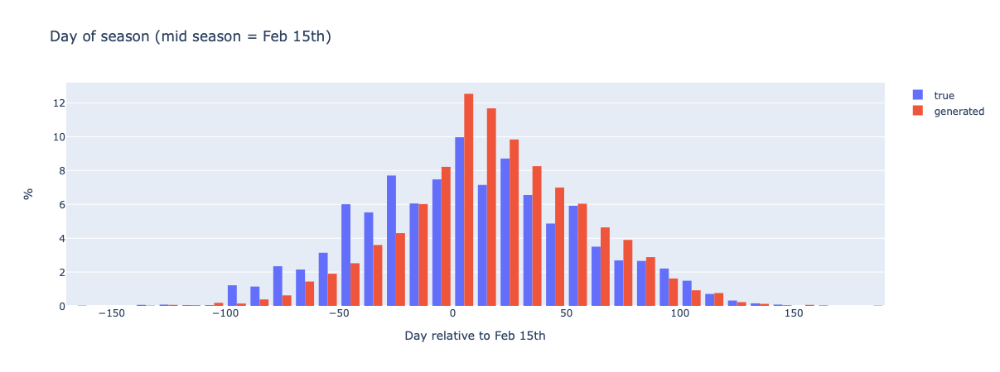

In [86]:
print(f'Mean/std day of season, for true={df_sel.day_of_season.mean():.3g}/{df_sel.day_of_season.std():.3g}, for generated={df_generated.day_of_season.mean():.3g}/{df_generated.day_of_season.std():.3g}')

fig = go.Figure(layout=dict(title='Day of season (mid season = Feb 15th)', bargroupgap=0.01, 
                            xaxis=dict(title='Day relative to Feb 15th'), yaxis=dict(title='%')))
fig.add_histogram(x=df_sel.day_of_season, name='true', nbinsx=52, histnorm='percent')
fig.add_histogram(x=df_generated.day_of_season, name='generated', nbinsx=52, histnorm='percent')

### Ski ratings

Mean/std ski rating num, for true=6.38/3.07, for generated=6.95/2.51


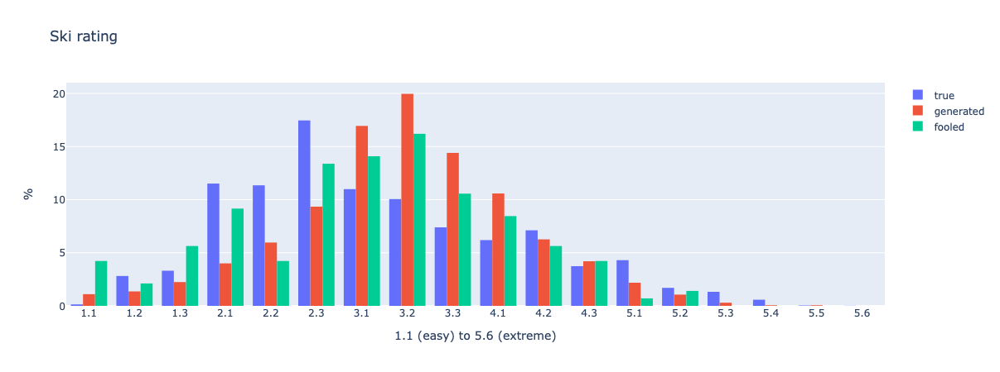

In [87]:
print(f'Mean/std ski rating num, for true={df_sel.ski_rating_num.mean():.3g}/{df_sel.ski_rating_num.std():.3g}, for generated={df_generated.ski_rating_num.mean():.3g}/{df_generated.ski_rating_num.std():.3g}')
fig = go.Figure(layout=dict(title='Ski rating', bargroupgap=0.01, 
                            xaxis=dict(title='1.1 (easy) to 5.6 (extreme)', categoryorder='array', categoryarray=list(ski_rating_unmapper.values()), type="category"), yaxis=dict(title='%')))
fig.add_histogram(x=df_outings[condition].ski_rating, name='true', histnorm='percent')
fig.add_histogram(x=df_generated.ski_rating, name='generated', histnorm='percent')
fig.add_histogram(x=df_generated2_fooled.ski_rating, name='fooled', histnorm='percent')

### Condition ratings

Mean/std condition rating num, for true=2.95/0.792, for generated=2.91/0.827


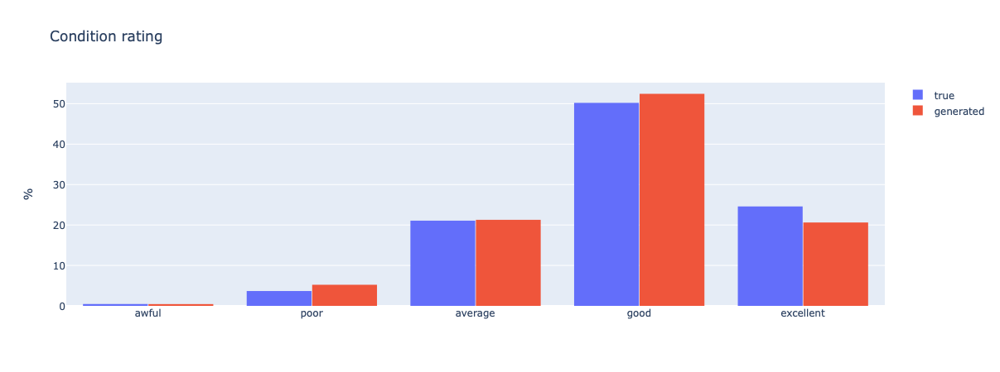

In [88]:
print(f'Mean/std condition rating num, for true={df_sel.condition_rating_num.mean():.3g}/{df_sel.condition_rating_num.std():.3g}, for generated={df_generated.condition_rating_num.mean():.3g}/{df_generated.condition_rating_num.std():.3g}')
fig = go.Figure(layout=dict(title='Condition rating', bargroupgap=0.01, 
                            xaxis=dict(categoryorder='array', categoryarray=list(rating_unmapper.values()), type="category"), yaxis=dict(title='%')))
fig.add_histogram(x=df_outings[condition].condition_rating, name='true', histnorm='percent')
fig.add_histogram(x=df_generated.condition_rating, name='generated', histnorm='percent')

### Temperatures

Mean/std morning temperature, for true=-5.31/6.7, for generated=-4.24/5.68


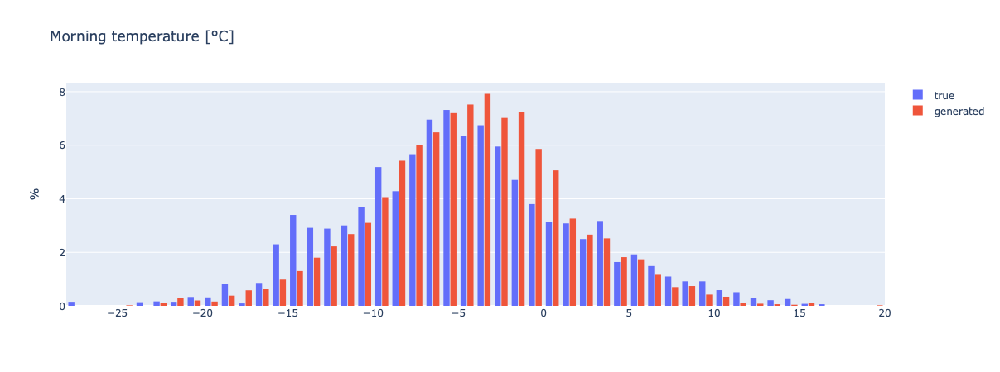

In [89]:
print(f'Mean/std morning temperature, for true={df_sel.TEMPERATURE_MORNING_C.mean():.3g}/{df_sel.TEMPERATURE_MORNING_C.std():.3g}, for generated={df_generated.TEMPERATURE_MORNING_C.mean():.3g}/{df_generated.TEMPERATURE_MORNING_C.std():.3g}')
fig = go.Figure(layout=dict(title='Morning temperature [°C]', bargroupgap=0.1, yaxis=dict(title='%')))
bins = {'start': -35, 'end': 30, 'size': 1}
fig.add_histogram(x=df_sel.TEMPERATURE_MORNING_C, name='true', histnorm='percent', xbins=bins)
fig.add_histogram(x=df_generated.TEMPERATURE_MORNING_C, name='generated', histnorm='percent', xbins=bins)

Mean/std 7 day morning temperature, for true=-4.79/5.38, for generated=-4.26/5.79


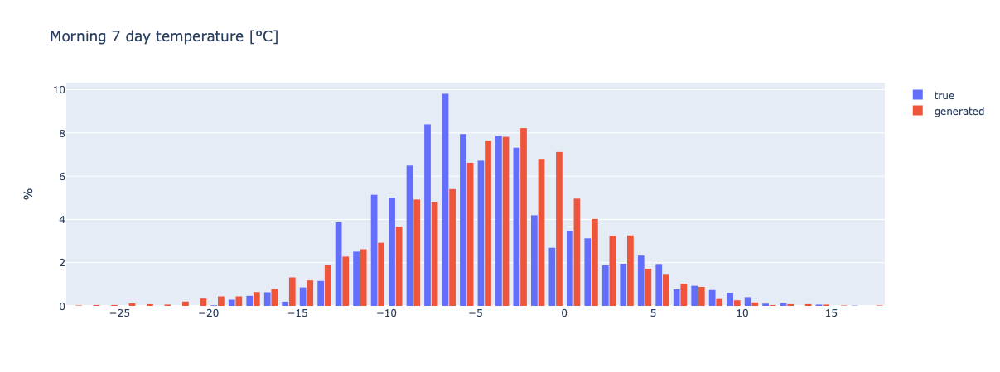

In [90]:
print(f'Mean/std 7 day morning temperature, for true={df_sel.temp_morning_7d.mean():.3g}/{df_sel.temp_morning_7d.std():.3g}, for generated={df_generated.temp_morning_7d.mean():.3g}/{df_generated.temp_morning_7d.std():.3g}')
fig = go.Figure(layout=dict(title='Morning 7 day temperature [°C]', bargroupgap=0.1, yaxis=dict(title='%')))
bins = {'start': -35, 'end': 30, 'size': 1}
fig.add_histogram(x=df_sel.temp_morning_7d, name='true', histnorm='percent', xbins=bins)
fig.add_histogram(x=df_generated.temp_morning_7d, name='generated', histnorm='percent', xbins=bins)

Mean/std 30 day morning temperature, for true=-4.72/4.23, for generated=-5.03/5.01


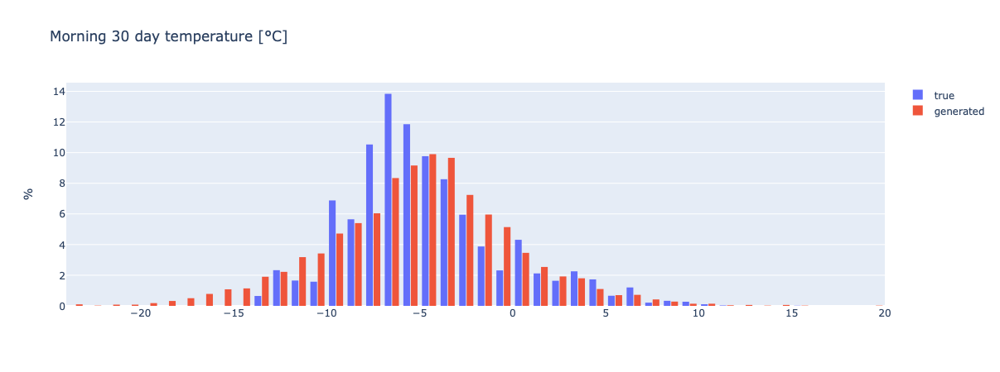

In [91]:
print(f'Mean/std 30 day morning temperature, for true={df_sel.temp_morning_30d.mean():.3g}/{df_sel.temp_morning_30d.std():.3g}, for generated={df_generated.temp_morning_30d.mean():.3g}/{df_generated.temp_morning_30d.std():.3g}')
fig = go.Figure(layout=dict(title='Morning 30 day temperature [°C]', bargroupgap=0.1, yaxis=dict(title='%')))
bins = {'start': -35, 'end': 30, 'size': 1}
fig.add_histogram(x=df_sel.temp_morning_30d, name='true', histnorm='percent', xbins=bins)
fig.add_histogram(x=df_generated.temp_morning_30d, name='generated', histnorm='percent', xbins=bins)

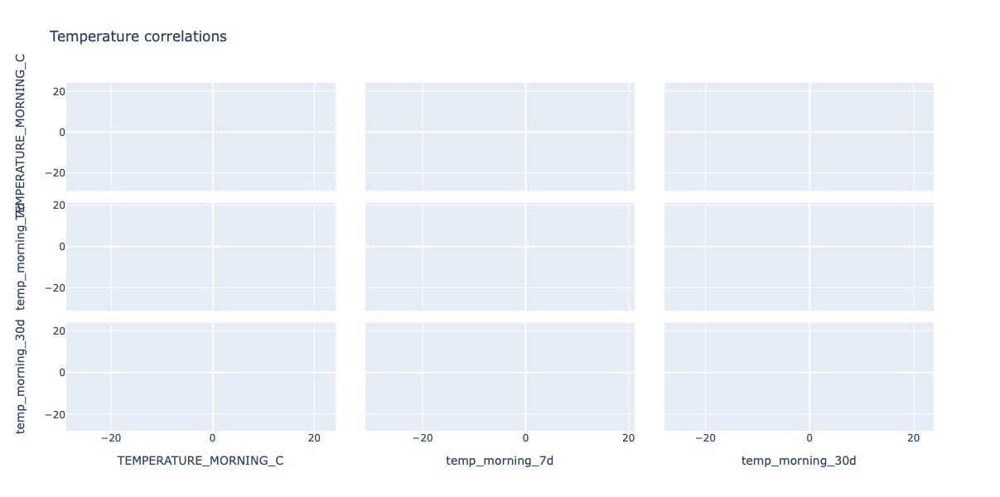

In [92]:
px.scatter_matrix(df_generated[['TEMPERATURE_MORNING_C', 'temp_morning_7d', 'temp_morning_30d']], opacity=0.1, 
                  title='Temperature correlations', height=600)

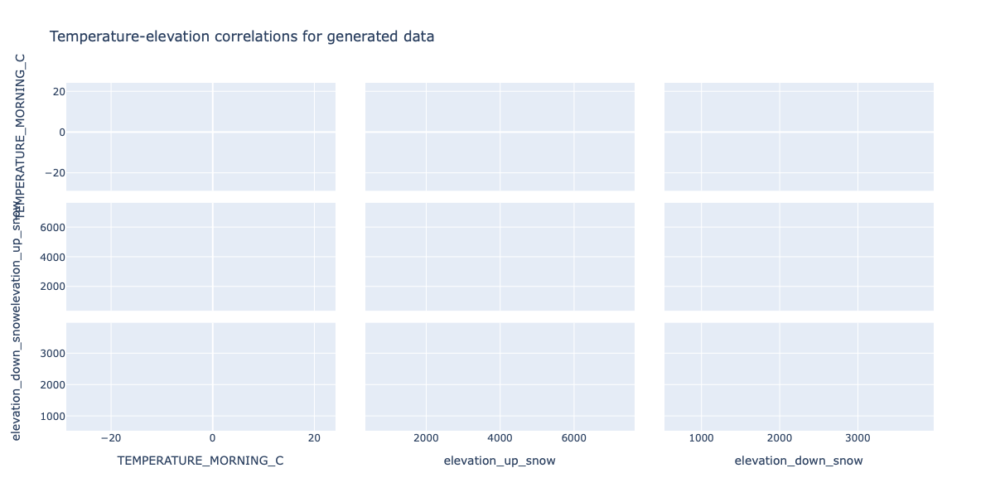

In [93]:
px.scatter_matrix(df_generated[['TEMPERATURE_MORNING_C', 'elevation_up_snow', 'elevation_down_snow']], opacity=0.1, 
                  title='Temperature-elevation correlations for generated data', height=600)

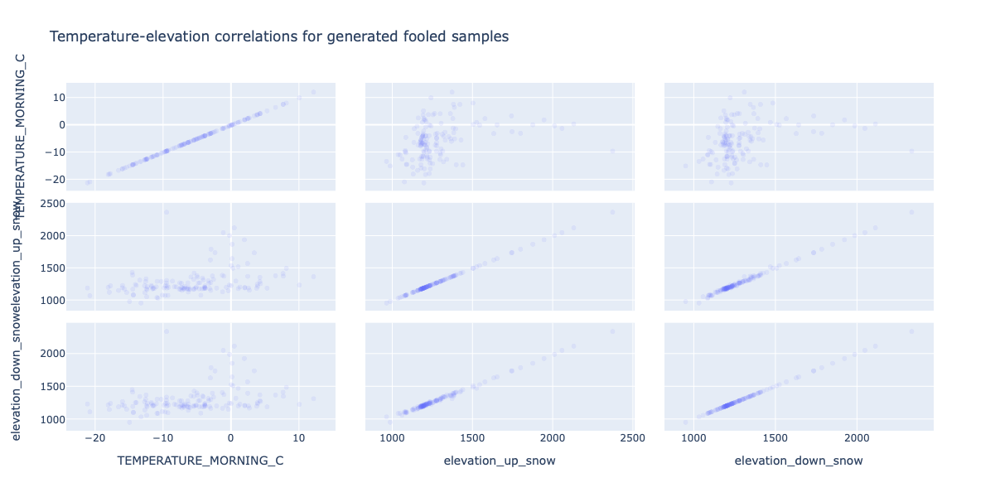

In [94]:
px.scatter_matrix(df_generated2_fooled[['TEMPERATURE_MORNING_C', 'elevation_up_snow', 'elevation_down_snow']], opacity=0.1, 
                  title='Temperature-elevation correlations for generated fooled samples', height=600)

# Test on a given outing

Trou de la Mouche: https://www.camptocamp.org/waypoints/37312/fr/trou-de-la-mouche
508 ski outings

Trou de la Mouche, Paccaly => Grand Crêt: https://www.camptocamp.org/outings?r=46396&act=skitouring
100 ski outings

In [95]:
def apply_single_scale(scaler, index, data):
    return (data - scaler.mean_[index]) / scaler.scale_[index]

In [96]:
tdlm_label = 'Trou de la Mouche'
tdlm_elevation_max = 2453
tdlm_elevation_max_scaled = apply_single_scale(scaler, used_cols.index('elevation_max'), tdlm_elevation_max)
tdlm_ski_rating = 6
tdlm_ski_rating_scaled = apply_single_scale(scaler, used_cols.index('ski_rating_num'), tdlm_ski_rating)
tdlm_num = 5000

In [97]:
tdlm_extrinsic = np.ones([tdlm_num, 1]).dot([[tdlm_ski_rating_scaled, tdlm_elevation_max_scaled]])

In [98]:
tdlm_temp = gen_temp.predict(np.random.normal(0, 1, [tdlm_num, num_latent2]))

In [99]:
tdlm_dep = gen_dependent.predict(np.c_[tdlm_extrinsic, tdlm_temp, np.random.normal(0, 1, [tdlm_num, num_latent_dep])])

In [100]:
df_tdlm = pd.DataFrame(scaler.inverse_transform(np.c_[tdlm_extrinsic, tdlm_temp, tdlm_dep]), columns=used_cols)

In [101]:
tdlm_scores = discriminator2.predict(np.c_[tdlm_extrinsic, tdlm_temp, tdlm_dep])
tdlm_fooled = tdlm_scores >= 0.5
tdlm_scores.mean(), tdlm_fooled.mean()

(0.13073339, 0.0704)

In [102]:
df_tdlm_fooled = df_tdlm[tdlm_fooled]
len(df_tdlm_fooled)

352

In [103]:
df_tdlm.head()

,ski_rating_num,elevation_max,elevation_up_snow,elevation_down_snow,condition_rating_num,TEMPERATURE_MORNING_C,temp_morning_7d,temp_morning_30d,day_of_season
0,6.0,2453.0,1704.687443,2326.697597,4.899105,-1.497308,2.630229,0.139807,39.928243
1,6.0,2453.0,2215.650005,1604.996785,2.470914,2.441094,2.668219,0.539231,68.142457
2,6.0,2453.0,1719.147410,2087.749911,4.185115,1.349426,4.130827,3.016254,62.201802
3,6.0,2453.0,1764.875449,1828.868651,3.840531,-2.862880,0.459720,1.327191,-52.807563
4,6.0,2453.0,1588.560949,1709.711332,4.982420,-8.372483,-4.840102,-3.203797,9.807572


In [104]:
df_tdlm_fooled.head()

,ski_rating_num,elevation_max,elevation_up_snow,elevation_down_snow,condition_rating_num,TEMPERATURE_MORNING_C,temp_morning_7d,temp_morning_30d,day_of_season
32,6.0,2453.0,1684.973306,1697.126876,2.508786,1.166461,1.731011,-2.735496,40.507671
43,6.0,2453.0,637.950735,677.862021,2.632941,-14.798624,-13.538665,-10.871623,-7.748767
98,6.0,2453.0,1567.704478,1563.786299,2.766036,-3.019185,-1.112087,-2.766100,51.651470
111,6.0,2453.0,103.312897,945.828150,2.603781,12.623067,3.626981,4.164809,138.782334
158,6.0,2453.0,1675.460511,1527.678394,2.555959,11.295596,9.240902,9.901684,126.873153


Elevation [m]


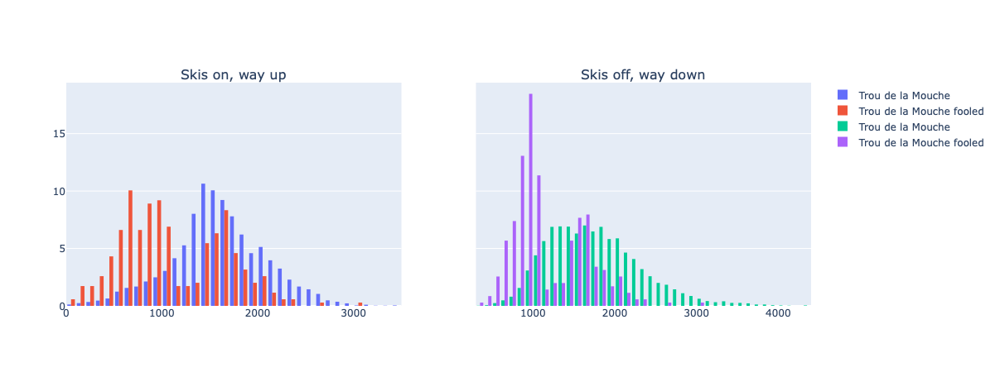

In [105]:
print('Elevation [m]')
fig = sp.make_subplots(rows=1, cols=2, shared_yaxes=True, subplot_titles=['Skis on, way up', 'Skis off, way down', 'Max'])
bins = {'start': 0, 'end': 4500, 'size': 100}
fig.add_trace(go.Histogram(x=df_tdlm['elevation_up_snow'], xbins=bins, name=tdlm_label, histnorm='percent'), row=1, col=1)
fig.add_trace(go.Histogram(x=df_tdlm_fooled['elevation_up_snow'], xbins=bins, name=tdlm_label + ' fooled', histnorm='percent'), row=1, col=1)
fig.add_trace(go.Histogram(x=df_tdlm['elevation_down_snow'], xbins=bins, name=tdlm_label, histnorm='percent'), row=1, col=2)
fig.add_trace(go.Histogram(x=df_tdlm_fooled['elevation_down_snow'], xbins=bins, name=tdlm_label + ' fooled', histnorm='percent'), row=1, col=2)

### Temperatures Trou de la Mouche

Mean/std morning temperature, for generated=-4.81/6.5


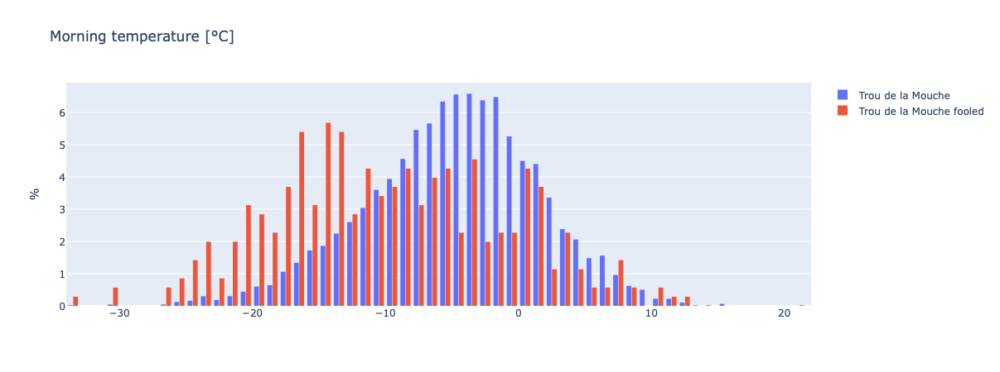

In [106]:
print(f'Mean/std morning temperature, for generated={df_tdlm.TEMPERATURE_MORNING_C.mean():.3g}/{df_tdlm.TEMPERATURE_MORNING_C.std():.3g}')
fig = go.Figure(layout=dict(title='Morning temperature [°C]', bargroupgap=0.1, yaxis=dict(title='%')))
bins = {'start': -35, 'end': 30, 'size': 1}
fig.add_histogram(x=df_tdlm.TEMPERATURE_MORNING_C, name=tdlm_label, histnorm='percent', xbins=bins)
fig.add_histogram(x=df_tdlm_fooled.TEMPERATURE_MORNING_C, name=tdlm_label + ' fooled', histnorm='percent', xbins=bins)

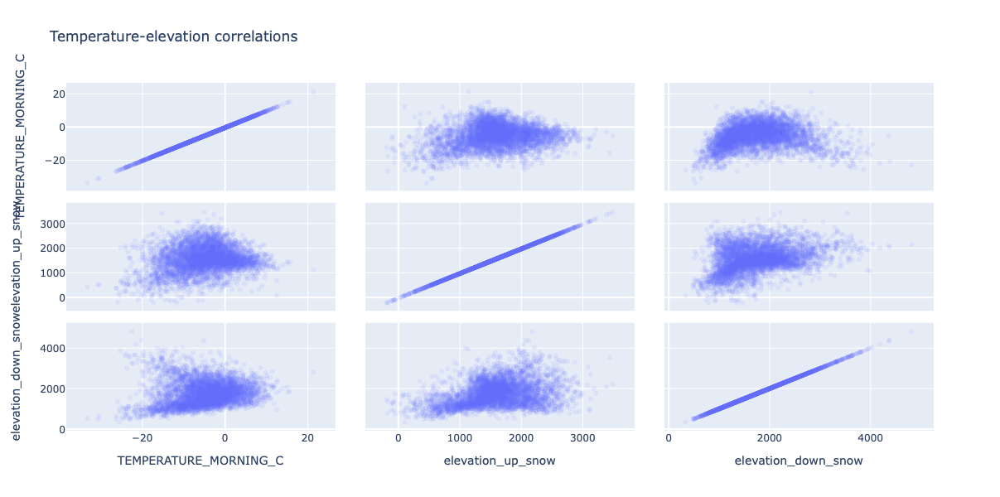

In [107]:
px.scatter_matrix(df_tdlm[['TEMPERATURE_MORNING_C', 'elevation_up_snow', 'elevation_down_snow']], opacity=0.1, 
                  title='Temperature-elevation correlations', height=600)

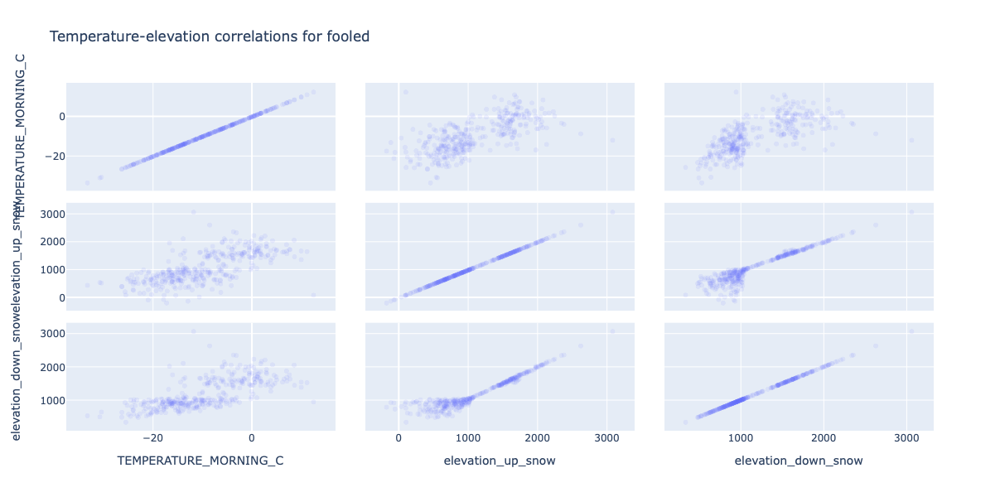

In [109]:
px.scatter_matrix(df_tdlm_fooled[['TEMPERATURE_MORNING_C', 'elevation_up_snow', 'elevation_down_snow']], opacity=0.1, 
                  title='Temperature-elevation correlations for fooled', height=600)